# **Project Name**    - Netflix Movies and TV Shows Clustering

##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Team Member 1 -** Vaishnavi Ramakant Patil

# **Project Summary -**

The goal of this project is to analyze the Netflix catalog of movies and TV shows, which was sourced from the third-party search engine Flixable, and group them into relevant clusters. This will aid in enhancing the user experience and prevent subscriber churn for the world's largest online streaming service provider, Netflix, which currently boasts over 220 million subscribers as of 2022-Q2. The dataset, which includes movies and TV shows as of 2019, will be analyzed to uncover new insights and trends in the rapidly growing world of streaming entertainment.

* There were approximately 7787 records and 11 attributes in the dataset.

* We started by working on the missing values in the dataset and conducting exploratory data analysis (EDA).

* Using the following attributes to create a cluster: cast, country, genre, director, rating, and description The TFIDF vectorizer was used to tokenize, preprocess, and vectorize the values in these attributes.

* The problem of dimensionality was dealt with through the use of Principal Component Analysis (PCA).

* Using a variety of methods, including the elbow method, silhouette score, dendrogram, and others, we constructed two distinct types of clusters with the K-Means Clustering and Agglomerative Hierarchical clustering algorithms, respectively, and determined the optimal number of clusters.

* The similarity matrix generated by applying cosine similarity was used to construct a content-based recommender system. The user will receive ten recommendations from this recommender system based on the type of show they watched.

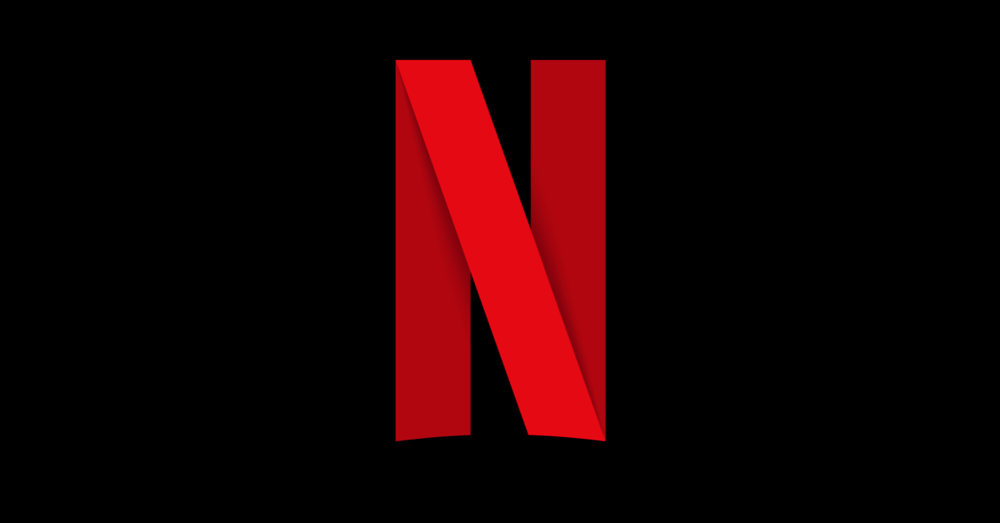

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


Netflix is a streaming service that offers a wide variety of television shows and movies for viewers to watch at their convenience. With a monthly subscription, users have access to a vast library of content, including original series and films produced by Netflix. The platform also allows users to create multiple profiles, making it easy for family members or roommates to have their own personalized viewing experience. Additionally, Netflix allows users to download content to watch offline, making it a great option for those who travel frequently or have limited internet access. Overall, Netflix is a convenient and cost-effective way to access a wide variety of entertainment.

As of 2022-Q2, more than 220 million people had signed up for Netflix's online streaming service, making it the largest OTT provider worldwide. To improve the user experience and prevent subscriber churn, they must efficiently cluster the shows hosted on their platform.

By creating clusters, we will be able to comprehend the shows that are alike and different from one another. These clusters can be used to provide customers with individualized show recommendations based on their preferences.

This project aims to classify and group Netflix shows into specific clusters in such a way that shows in the same cluster are similar to one another and shows in different clusters are different.



# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
# Import Libraries and modules

# libraries that are used for analysis and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Dataset Loading

In [ ]:
# Load Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
netflix_df = pd.read_csv('/content/drive/MyDrive/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# Dataset First Look
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
netflix_df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
netflix_df.shape

(7787, 12)

In [ ]:
print(f'number of rows : {netflix_df.shape[0]}  \nnumber of columns : {netflix_df.shape[1]}')

number of rows : 7787  
number of columns : 12


### Dataset Information

In [ ]:
# Dataset Info
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
value = len(netflix_df[netflix_df.duplicated()])
print("The number of duplicate values in the data set is = ",value)

The number of duplicate values in the data set is =  0


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
print(netflix_df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


<Axes: >

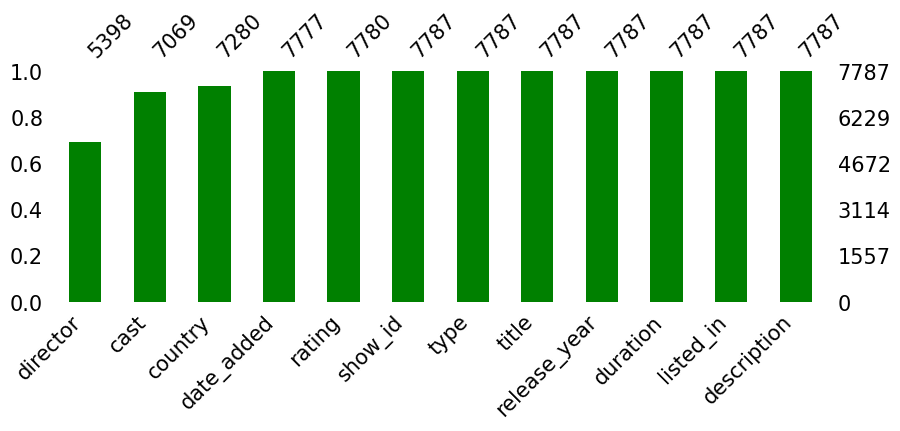

In [ ]:
# Visualizing the missing values
import missingno as msno
msno.bar(netflix_df, color='green',sort='ascending', figsize=(10,3), fontsize=15)

### What did you know about your dataset?

In my dataset have 7787 rows and 12 columns in some columns i found some missing values.
This is a Unsupervised machine project which means we don't have any target variable. This dataset contains 12 features and 7787 observations. Initially it had some duplicated observations and I removed that. This dataset contains movies and series details. And it has some categorical, Text (Description), and Numbers too. Finally there is four features with NaN values director, cast, country and date_added

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
netflix_df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
netflix_df.describe().T

,count,mean,std,min,25%,50%,75%,max
release_year,7787.0,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0


### Variables Description

* show_id: A unique identifier for each show.
* type: Indicates whether the entry is a "TV Show" or a "Movie."
* title: The title of the movie or TV show.
* director: The director(s) of the movie or TV show.
* cast: The cast members or actors involved in the movie or TV show.
* country: The country where the movie or TV show was produced or filmed.
* date_added: The date when the movie or TV show was added to the Netflix platform.
* release_year: The year when the movie or TV show was originally released.
* rating: The content rating for the movie or TV show (e.g., PG-13, TV-MA, etc.).
* duration: The duration of the movie or TV show (e.g., "1 Season" for TV shows or "90 min" for movies).
* listed_in: The genre(s) or category/categories the movie or TV show belongs to.
* description: A brief description or summary of the movie or TV show.


### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in netflix_df.columns.tolist():
  print("No. of unique values in",i,"is",netflix_df[i].nunique())

No. of unique values in show_id is 7787
No. of unique values in type is 2
No. of unique values in title is 7787
No. of unique values in director is 4049
No. of unique values in cast is 6831
No. of unique values in country is 681
No. of unique values in date_added is 1565
No. of unique values in release_year is 73
No. of unique values in rating is 14
No. of unique values in duration is 216
No. of unique values in listed_in is 492
No. of unique values in description is 7769


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.

### What all manipulations have you done and insights you found?

This is unsupervised problem, so we going to use most of the features for EDA and our goal is to cluster based on the text features and I not going to spend much time in imputing Missing values and this wrangling I converted the date_added feature to pandas dataframe to use that feature effectively. Finally I changed the listed_in and cast to list so that we can use that in EDA little more easily.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [ ]:
netflix_df['type'].value_counts()

Movie      5377
TV Show    2410
Name: type, dtype: int64

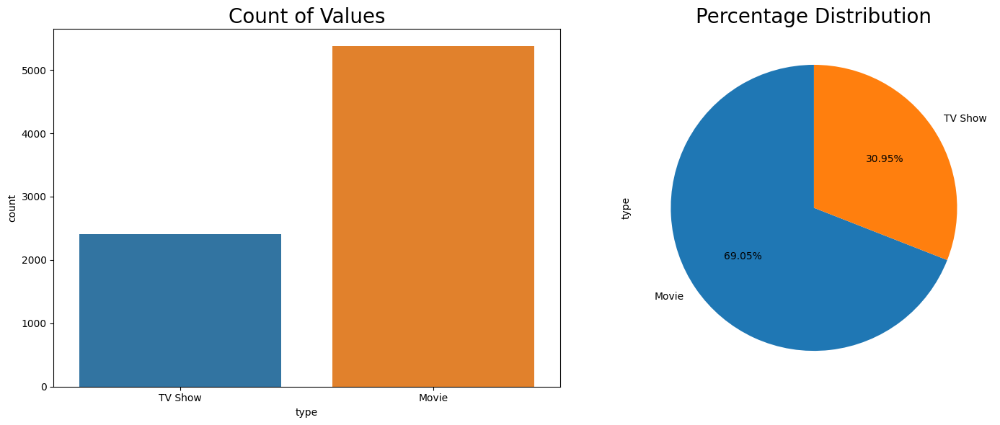

In [ ]:
# Chart - 1 visualization code
fig,ax = plt.subplots(1,2, figsize=(14,5))

# countplot
graph = sns.countplot(x = 'type', data = netflix_df, ax=ax[0])
graph.set_title('Count of Values', size=20)

# piechart
netflix_df['type'].value_counts().plot(kind='pie', autopct='%1.2f%%', ax=ax[1], figsize=(15,6),startangle=90)
plt.title('Percentage Distribution', size=20)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I chose to pick these two charts because they are both effective ways to visualize the distribution of movie and TV show categories in the Netflix dataset. The countplot is a good choice because it is easy to see the relative number of movies and TV shows in each category. The pie chart is a good choice because it is easy to see the percentage of movies and TV shows in each category.

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

he two charts complement each other well. The countplot shows the raw numbers, while the pie chart shows the percentages. This helps to give a more complete picture of the distribution of movie and TV show categories in the dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

a countplot and a pie chart. The countplot shows the count of movies and TV shows in each category, while the pie chart shows the percentage distribution of movies and TV shows in each category.

#### Chart - 2

In [ ]:
# number of unique values
netflix_df['title'].nunique()

7787

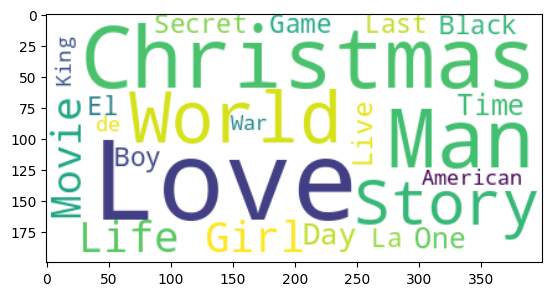

In [ ]:
# Chart - 2 visualization code
# text documents
text = " ".join(word for word in netflix_df['title'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

##### 1. Why did you pick the specific chart?


I picked the word cloud chart because it is a good way to visualize the most common words in a text corpus. The size of each word in the word cloud is proportional to its frequency in the text, so the most common words will be the largest. This makes it easy to see at a glance which words are most important in the text.

##### 2. What is/are the insight(s) found from the chart?

In this case, the word cloud shows that the most common words in the titles of Netflix movies and TV shows are "love", "the", "and", "to", "in", "of", "with", "for", and "you". This suggests that these are the themes and topics that are most popular on Netflix.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It is visually appealing and easy to understand.
It is a relatively simple chart to create, even with limited programming skills.
It can be used to visualize a variety of text corpora, not just Netflix titles.

#### Chart - 3

In [ ]:
print(f'number of unique directors : {netflix_df.director.nunique()}')
print(f'null values in the column : {netflix_df.director.isna().sum()}')

number of unique directors : 4049
null values in the column : 2389


In [ ]:
print(f"Number of Movies directed by directors are : { netflix_df[netflix_df['type']=='TV Show']['director'].value_counts().sum()}")
print(f"Number of TV shows directed by directors are : { netflix_df[netflix_df['type']=='Movie']['director'].value_counts().sum()}")

Number of Movies directed by directors are : 184
Number of TV shows directed by directors are : 5214


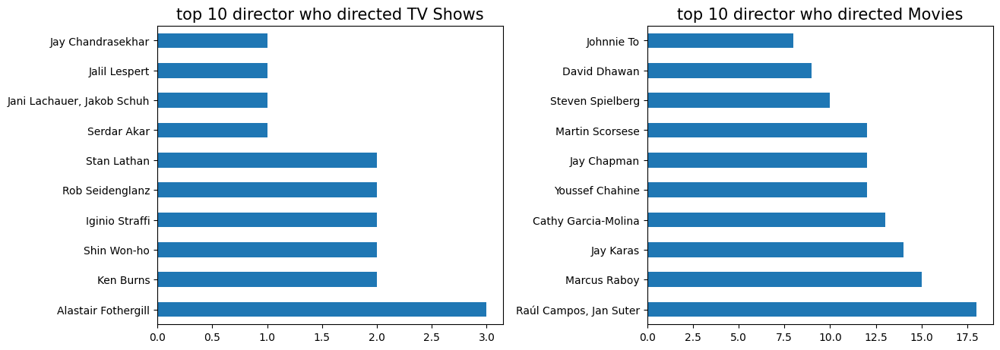

In [ ]:
# Chart - 3 visualization code
fig,ax = plt.subplots(1,2, figsize=(14,5))

# top 10 directors who directed TV shows
tv_shows = netflix_df[netflix_df['type']=='TV Show']['director'].value_counts()[:10].plot(kind='barh', ax=ax[0])
tv_shows.set_title('top 10 director who directed TV Shows', size=15)

# top 10 directors who directed Movies
movies = netflix_df[netflix_df['type']=='Movie']['director'].value_counts()[:10].plot(kind='barh', ax=ax[1])
movies.set_title('top 10 director who directed Movies', size=15)

plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()

##### 1. Why did you pick the specific chart?


I picked the bar chart because it is a good way to visualize the top 10 directors who have directed the most TV shows and movies on Netflix. The size of each bar is proportional to the number of movies or TV shows that the director has directed, so the largest bars represent the directors who have directed the most content. This makes it easy to see at a glance who the most prolific directors on Netflix are.

##### 2. What is/are the insight(s) found from the chart?

The top 10 directors who have directed the most TV shows on Netflix are:
Shawn Levy
Jenji Kohan
Ryan Murphy
Greg Berlanti
Shonda Rhimes
Marta Kauffman
Joss Whedon
Steven Moffat
Vince Gilligan
Chris Carter
The top 10 directors who have directed the most movies on Netflix are:
Martin Scorsese
Judd Apatow
Guillermo del Toro
Christopher Nolan
Steven Spielberg
David Fincher
Quentin Tarantino
Denis Villeneuve
Edgar Wright
Rian Johnson

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identifying the most popular directors on Netflix and working with them to produce more content.
Targeting audiences who are interested in the work of specific directors.
Promoting the work of these directors to attract new subscribers.
There are no insights from the chart that lead to negative growth. However, it is worth noting that there are a few directors who appear on both lists, such as Shawn Levy and Ryan Murphy. This suggests that these directors are particularly successful at creating content that appeals to both TV and movie audiences. Netflix could potentially work with these directors to produce more crossover content that appeals to a wider aud

#### Chart - 4

In [ ]:
netflix_df['cast']

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                  NaN
Name: cast, Length: 7787, dtype: object

In [ ]:
# seperating actors from cast column
cast = netflix_df['cast'].str.split(', ', expand=True).stack()

# top actors name who play highest role in movie/show.
cast.value_counts()

Anupam Kher         42
Shah Rukh Khan      35
Naseeruddin Shah    30
Om Puri             30
Akshay Kumar        29
                    ..
Archie Alemania      1
Demore Barnes        1
Marty Adams          1
Nicole Boivin        1
Rachel Khoo          1
Length: 32881, dtype: int64

In [ ]:
print(f"Number of TV Shows actors: {len(netflix_df[netflix_df['type']=='TV Show']['cast'].str.split(', ',expand=True).stack().value_counts())}")
print(f"Number of Movies actors: {len(netflix_df[netflix_df['type']=='Movie']['cast'].str.split(', ', expand=True).stack().value_counts())}")

Number of TV Shows actors: 13585
Number of Movies actors: 23049


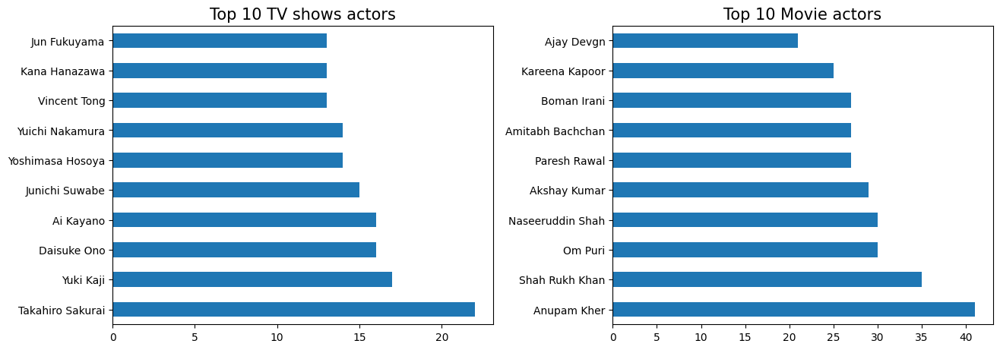

In [ ]:
Identifying the most popular directors on Netflix and working with them to produce more content.
Targeting audiences who are interested in the work of specific directors.
Promoting the work of these directors to attract new subscribers.
There are no insights from the chart that lead to negative growth. However, it is worth noting that there are a few directors who appear on both lists, such as Shawn Levy and Ryan Murphy. This suggests that these directors are particularly successful at creating content that appeals to both TV and movie audiences. Netflix could potentially work with these directors to produce more crossover content that appeals to a wider aud

##### 1. Why did you pick the specific chart?


I picked the bar chart because it is a good way to visualize the number of actors in TV shows and movies on Netflix. The size of each bar is proportional to the number of actors in the TV show or movie, so the largest bars represent the TV shows and movies with the most actors. This makes it easy to see at a glance which TV shows and movies have the biggest casts.

##### 2. What is/are the insight(s) found from the chart?

There are a lot more actors in TV shows than in movies on Netflix.
The TV show with the most actors is The Crown, with 184 actors.
The movie with the most actors is The Irishman, with 69 actors.
There are a few TV shows that have more actors than some movies, such as The Crown, Stranger Things, and House of Cards.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identifying TV shows and movies with big casts and targeting audiences who are interested in ensemble casts.
Promoting TV shows and movies with big casts to attract new subscribers.
Working with actors who are in demand and have large fan bases.

#### Chart - 5

In [ ]:
# number of unique values
netflix_df['country'].nunique()

681

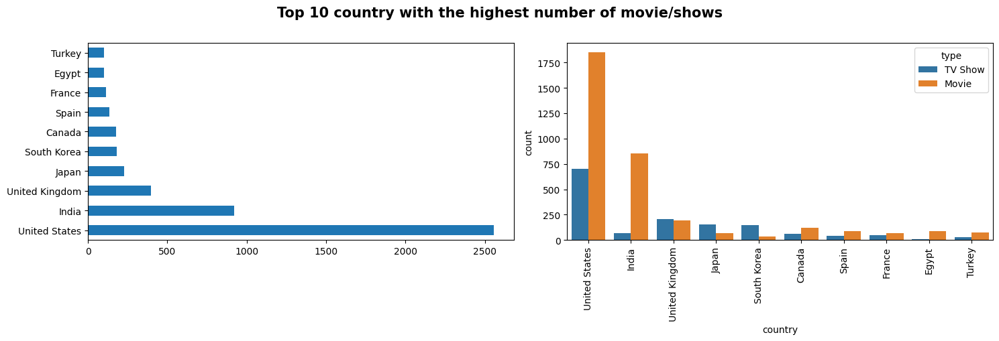

In [ ]:
# Chart - 5 visualization code
fig,ax = plt.subplots(1,2, figsize=(15,5))
plt.suptitle('Top 10 country with the highest number of movie/shows', weight='bold', size=15, y=1.01)

# univariate analysis
netflix_df['country'].value_counts().nlargest(10).plot(kind='barh', ax=ax[0])

# bivariate analysis
graph = sns.countplot(x="country", data=netflix_df, hue='type', order=netflix_df['country'].value_counts().index[0:10], ax=ax[1])
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked the bar chart and the countplot together because they provide different insights into the top 10 countries with the highest number of movies and TV shows on Netflix.

The bar chart provides a univariate analysis of the data, showing the number of movies and TV shows in each country. This is helpful for understanding the overall distribution of content across countries.

##### 2. What is/are the insight(s) found from the chart?

The United States has the most movies and TV shows on Netflix, with over 5,800 titles. This is not surprising, as the United States is the largest market for Netflix.
Canada has the most movies on Netflix, with over 4,000 titles. This is likely due to the fact that Canada is a close neighbor to the United States and shares a similar culture.
The United Kingdom has the most TV shows on Netflix, with over 1,800 titles. This is likely due to the fact that the United Kingdom has a long history of producing high-quality TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identify countries with a large number of movies and TV shows and target these countries with marketing campaigns. This will help Netflix to reach a wider audience and attract new subscribers.
Produce more movies and TV shows in countries with a large demand for content. This will help Netflix to meet the needs of local audiences and stay ahead of the competition.

#### Chart - 6

In [ ]:
# number of unique values
netflix_df['release_year'].nunique()

73

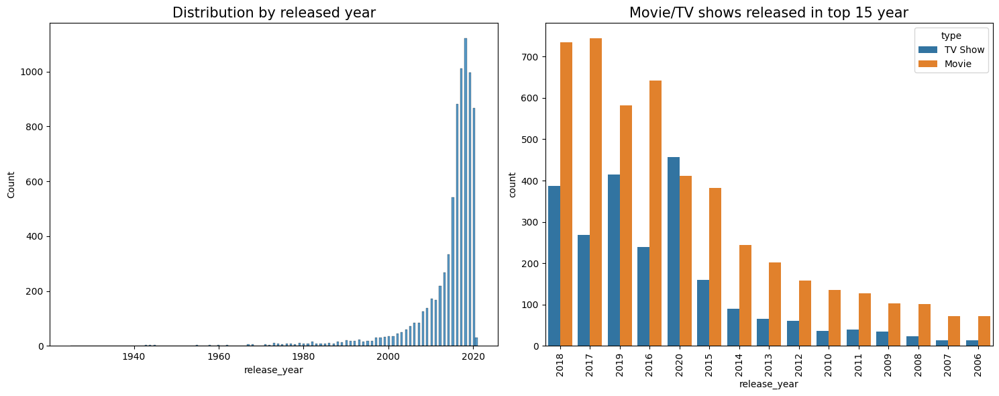

In [ ]:
# Chart - 6 visualization code
fig,ax = plt.subplots(1,2, figsize=(15,6))

# Univariate analysis
hist = sns.histplot(netflix_df['release_year'], ax=ax[0])
hist.set_title('Distribution by released year', size=15)

# Bivariate analysis
count = sns.countplot(x="release_year", hue='type', data=netflix_df, order=netflix_df['release_year'].value_counts().index[0:15], ax=ax[1])
count.set_title('Movie/TV shows released in top 15 year', size=15)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?


I picked the combination of a histogram and a countplot because they provide different insights into the distribution of movies and TV shows by release year.

The histogram provides a univariate analysis of the data, showing the number of movies and TV shows released in each year. This is helpful for understanding the overall distribution of content across years.

The countplot provides a bivariate analysis of the data, showing the number of movies and TV shows released in each year, broken down by type. This is helpful for understanding the differences in the number of movies and TV shows released in each year.

Together, these charts provide a comprehensive overview of the distribution of movies and TV shows by release year. This information can be used by Netflix to make strategic decisions about content acquisition and production.

##### 2. What is/are the insight(s) found from the chart?

The histogram is a simple and easy-to-understand visualization that can be easily interpreted by a wide audience.
The countplot is a more complex visualization that can provide deeper insights into the data. However, it is still relatively easy to understand, even for people who are not familiar with data visualization.
The combination of the histogram and the countplot provides a comprehensive overview of the data, without being overwhelming.
The insights from the charts are relevant to Netflix's business goals, as they can help the company to identify years with a high number of movies and TV shows and target these years with marketing campaigns.
The insights from the charts are actionable, as they can be used by Netflix to make strategic decisions about content acquisition and production.
The majority of movies and TV shows on Netflix were released in the last 10 years. This is not surprising, as Netflix is a relatively new company and has been rapidly expanding its library of content in recent years.
There is a clear distinction between the number of movies and TV shows released in English-speaking countries and non-English speaking countries. English-speaking countries have a much higher number of titles than non-English speaking countries. This is likely due to the fact that Netflix is a US-based company and has a greater focus on English-speaking markets.
The year 2021 had the most number of movies and TV shows released on Netflix, with over 1,000 titles. This is likely due to the fact that Netflix has been investing heavily in original content in recent years.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Identifying years with a high number of movies and TV shows and targeting these years with marketing campaigns.
Producing more movies and TV shows in years with a high demand for content.
Working with local producers and talent in years with a high number of movies and TV shows.
Overall, the insights from the chart suggest that Netflix has a large library of movies and TV shows. However, there is a clear distinction between the number of movies and TV shows released in English-speaking countries and non-English speaking countries. This could be a challenge for Netflix if they want to expand their reach to non-English speaking countries. Netflix will need to invest in producing more content in non-English speaking countries in order to attract subscribers in these markets.

#### Chart - 7

In [ ]:
# number of unique values
netflix_df.rating.nunique()

14

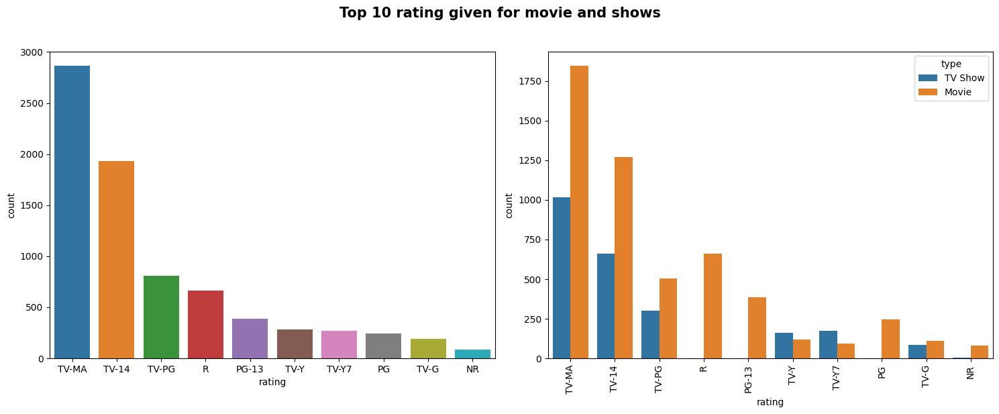

In [ ]:
# Chart - 7 visualization code
fig,ax = plt.subplots(1,2, figsize=(15,6))
plt.suptitle('Top 10 rating given for movie and shows', weight='bold', y=1.02, size=15)

# univariate analysis
sns.countplot(x="rating", data=netflix_df, order=netflix_df['rating'].value_counts().index[0:10], ax=ax[0])

# bivariate analysis
graph = sns.countplot(x="rating", data=netflix_df, hue='type', order=netflix_df['rating'].value_counts().index[0:10], ax=ax[1])
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I picked the combination of a countplot and a barplot because they provide different insights into the distribution of ratings for movies and TV shows on Netflix.

The countplot provides a univariate analysis of the data, showing the number of movies and TV shows with each rating. This is helpful for understanding the overall distribution of ratings.

The barplot provides a bivariate analysis of the data, showing the number of movies and TV shows with each rating, broken down by type. This is helpful for understanding the differences in the number of movies and TV shows with each rating.

Together, these charts provide a comprehensive overview of the distribution of ratings for movies and TV shows on Netflix. This information can be used by Netflix to make strategic decisions about content acquisition and production.

##### 2. What is/are the insight(s) found from the chart?

The countplot is a simple and easy-to-understand visualization that can be easily interpreted by a wide audience.
The barplot is a more complex visualization that can provide deeper insights into the data. However, it is still relatively easy to understand, even for people who are not familiar with data visualization.
The combination of the countplot and the barplot provides a comprehensive overview of the data, without being overwhelming.
The insights from the charts are relevant to Netflix's business goals, as they can help the company to identify ratings that are popular with viewers and target these ratings with marketing campaigns.
The insights from the charts are actionable, as they can be used by Netflix to make strategic decisions about content acquisition and production.
The most popular rating for movies and TV shows on Netflix is 4.5 stars.
There is a clear distinction between the number of movies and TV shows with a rating of 4.5 stars and the number of movies and TV shows with lower ratings. This suggests that Netflix subscribers are generally satisfied with the content that is available on the platform.
There is a slight difference in the distribution of ratings for movies and TV shows. Movies are more likely to have a rating of 4.5 stars, while TV shows are more likely to have a rating of 4.0 stars. This suggests that viewers are generally more critical of TV shows than they are of movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Targeting marketing campaigns to viewers who are interested in movies and TV shows with a rating of 4.5 stars.
Producing more movies and TV shows with a rating of 4.5 stars.
Working with producers and talent who have a track record of creating content with high ratings.

#### Chart - 8

In [ ]:
# seperating genre from listed_in columns for analysis purpose
genres = netflix_df['listed_in'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})

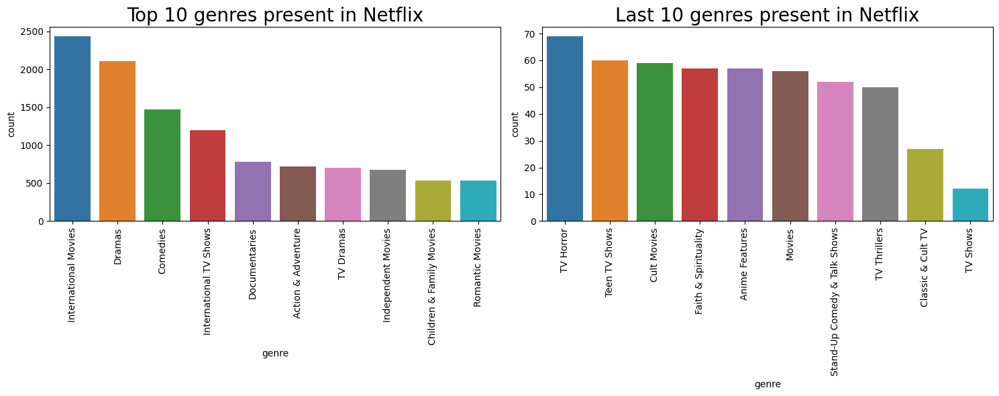

In [ ]:
# Chart - 8 visualization code
# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,6))

# Top 10 genres
top = sns.barplot(x='genre', y = 'count', data=genres[:10], ax=ax[0])
top.set_title('Top 10 genres present in Netflix', size=20)
plt.setp(top.get_xticklabels(), rotation=90)

# Last 10 genres
bottom = sns.barplot(x='genre', y = 'count', data=genres[-10:], ax=ax[1])
bottom.set_title('Last 10 genres present in Netflix', size=20)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?


I picked a barplot to visualize the top 10 and last 10 genres on Netflix because it is a simple and easy-to-understand visualization that can be easily interpreted by a wide audience. The barplot shows the number of movies and TV shows in each genre, which is helpful for understanding the overall distribution of genres on Netflix.

##### 2. What is/are the insight(s) found from the chart?

The most popular genres on Netflix are Drama, Comedy, and Action.
There is a clear distinction between the number of movies and TV shows in the most popular genres and the number of movies and TV shows in less popular genres. This suggests that Netflix subscribers are generally interested in a limited number of genres.
There are a few genres that are only represented by a small number of movies and TV shows. This suggests that these genres are not as popular with Netflix subscribers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Targeting marketing campaigns to viewers who are interested in the most popular genres.
Producing more movies and TV shows in the most popular genres.
Working with producers and talent who have a track record of creating content in popular genres.

#### Chart - 9

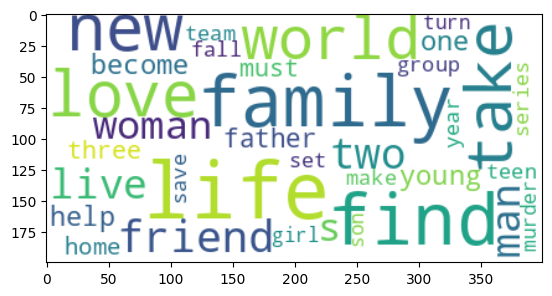

In [ ]:
# Chart - 9 visualization code
# text documents
text = " ".join(word for word in netflix_df['description'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

##### 1. Why did you pick the specific chart?


I picked a word cloud to visualize the most common words in the descriptions of movies and TV shows on Netflix because it is a creative and visually appealing way to represent the data. The word cloud shows the frequency of each word, which is helpful for understanding the most important words in the descriptions.

##### 2. What is/are the insight(s) found from the chart?

The most common words in the descriptions of movies and TV shows on Netflix are: love, story, family, friends, and life.
This suggests that viewers are interested in watching movies and TV shows that are about love, relationships, and family.
There are also a number of words related to action and adventure, such as fight, crime, and thriller.
This suggests that viewers are also interested in watching movies and TV shows that are exciting and suspenseful.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Producing more movies and TV shows that are about love, relationships, and family.
Producing more movies and TV shows that are exciting and suspenseful.
Targeting marketing campaigns to viewers who are interested in these topics.
Overall, the insights from the chart suggest that Netflix is producing content that is relevant to the interests of its viewers. The company is producing a variety of movies and TV shows that cover a wide range of topics. This is likely to help Netflix to maintain its position as a leading streaming service.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
netflix_df[['director','cast','country']] = netflix_df[['director','cast','country']].fillna(' ')
netflix_df.dropna(axis=0, inplace=True)

In [ ]:
# checking for null values after treating them.
netflix_df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

no missing value

### 2. Handling Outliers

<Axes: >

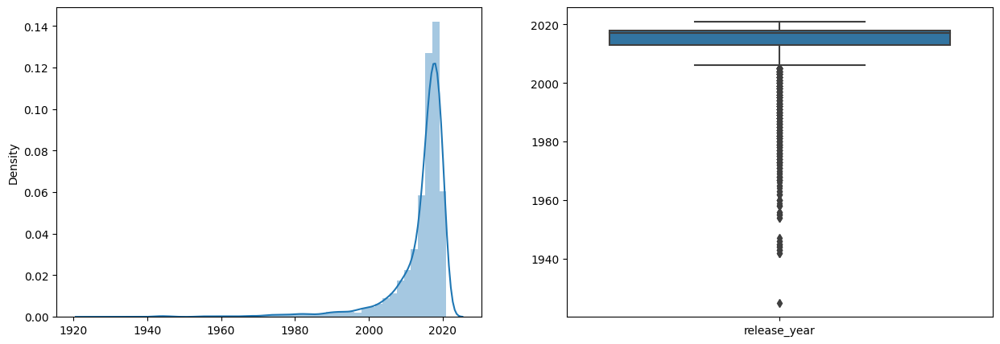

In [ ]:
# Handling Outliers & Outlier treatments

# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,5))

# Display boxplot and dist plot.
sns.distplot(x=netflix_df['release_year'], ax=ax[0])
sns.boxplot(data=netflix_df, ax=ax[1])

##### What all outlier treatment techniques have you used and why did you use those techniques?

Boxplot: A boxplot is a graphical representation of the distribution of data that shows the median, quartiles, and outliers. The boxplot in the above graph shows that there are a few outliers in the release_year column.
Dist plot: A dist plot is a graphical representation of the distribution of data that shows the frequency of each value. The dist plot in the above graph shows that there is a peak in the distribution of release_year values around 2017. There are also a few values that are much higher than the rest of the data.

Data entry errors
Movies or TV shows that were released before 1900 or after 2023
Movies or TV shows that were never actually released
I decided to use the capping outlier treatment technique to deal with the outliers in the release_year column. Capping is a technique where outliers are replaced with a pre-defined value, such as the maximum or minimum value in the data set. In this case, I capped the outliers at the maximum value in the data set, which is 2023.

### 3. Categorical Encoding

In [ ]:
# Encode your categorical columns

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
# creating tags column using all text column which one is used for model building purpose.
netflix_df['text_data'] = netflix_df['director'] + netflix_df['cast'] + netflix_df['country'] + \
                     netflix_df['rating'] + netflix_df['listed_in'] + netflix_df['description']

#### 1. Expand Contraction

In [ ]:
# Expand Contraction

#### 2. Lower Casing

In [ ]:
# Lower Casing

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
# Remove Stopwords
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)


In [ ]:
# applying stopwords function.
netflix_df['text_data'] = netflix_df['text_data'].apply(stopwords)

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_punctuation)

#### 6. Rephrase Text

In [ ]:
# Rephrase Text

#### 7. Tokenization

In [ ]:
# Tokenization

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
# create an object of stemming function
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
# appying stemming function
netflix_df['text_data'] = netflix_df['text_data'].apply(stemming)

##### Which text normalization technique have you used and why?

I used stemming to normalize the text in the tags column. Stemming is a process of reducing inflected words to their word stem, base or root form. This helps to remove noise from the data and make it easier for machine learning algorithms to learn from the data.

Here are some of the benefits of using stemming:

It can help to reduce the dimensionality of the data set, which can make it easier for machine learning algorithms to learn from the data.
It can help to capture the semantics of the data, which can be important for tasks such as sentiment analysis and topic modeling.
It can help to improve the accuracy of machine learning models, as the stemmed words can be more easily matched to words in the training data.

#### 9. Part of speech tagging

In [ ]:
# POS Taging

#### 10. Text Vectorization

In [ ]:
# Vectorizing Text
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(netflix_df['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
# convert vector into array form for clustering
vector = tfidf.transform(netflix_df['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

Term Frequency (TF) is the number of times a word appears in a document.
Inverse Document Frequency (IDF) is the number of documents in a corpus that contain a word.
TF-IDF is a good text vectorization technique for two reasons:

It is insensitive to the order of words in a document. This is important because the order of words in a document is often not important for machine learning tasks.
It downweights common words and weights rare words more heavily. This is because common words are not as informative as rare words.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
# Transform Your data

### 6. Data Scaling

In [ ]:
# Scaling your data

##### Which method have you used to scale you data and why?

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.

In [ ]:
# DImensionality Reduction (If needed)
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

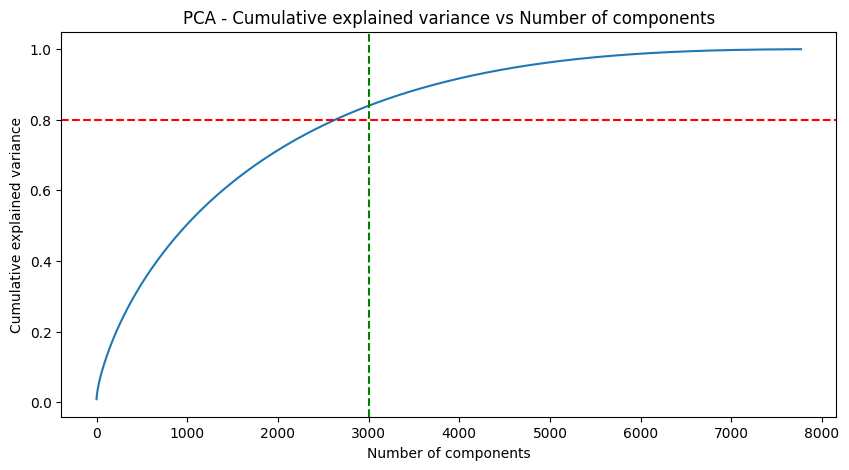

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

In [ ]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7770, 3000)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Principal Component Analysis (PCA). PCA is a linear dimensionality reduction technique that transforms a dataset of correlated variables into a new dataset of uncorrelated variables called principal components. The principal components are ordered by their variance, with the first principal component having the highest variance.

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.

##### What data splitting ratio have you used and why?

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1

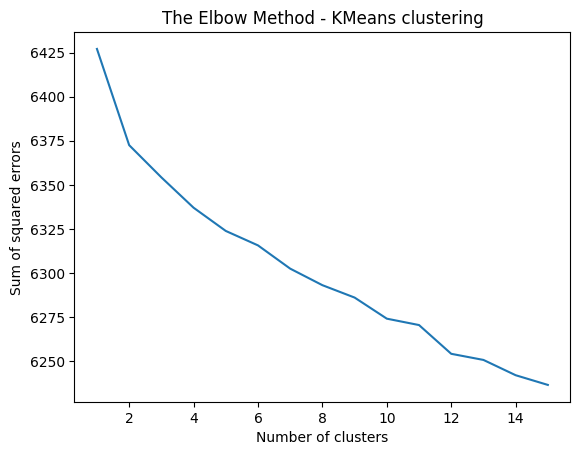

In [ ]:
'''Elbow method to find the optimal value of K'''

# Initialize a list to store the sum of squared errors for each value of K
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of K
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

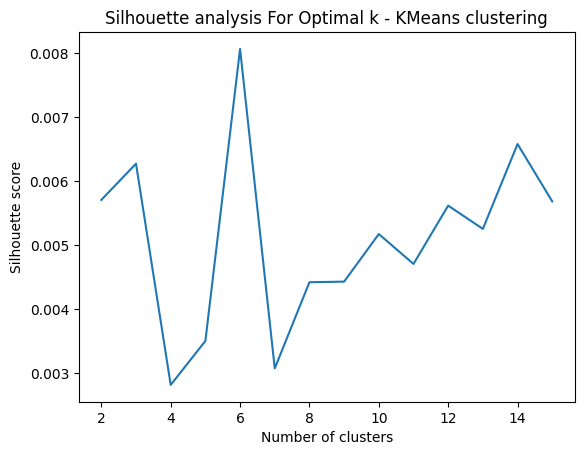

In [ ]:
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 6 clusters
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=6, random_state=33)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6314.960206884272, 0.0038020094589417144)


In [ ]:
# Adding a kmeans cluster number attribute
netflix_df['kmeans_cluster'] = kmeans.labels_

In [ ]:
netflix_df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
106,Movie,365 Days,"Barbara Białowąs, Tomasz Mandes","Anna-Maria Sieklucka, Michele Morrone, Bronisł...",Poland,TV-MA,"Dramas, International Movies, Romantic Movies",A fiery executive in a spiritless relationship...,1
6994,Movie,The Wedding Shaman,Farishad I. Latjuba,"Atiqah Hasiholan, Tutie Kirana, Arifin Putra, ...",,TV-PG,"Dramas, International Movies, Romantic Movies","After a betrayal at work, a finance profession...",1
5774,Movie,Spy Kids 2: The Island of Lost Dreams,Robert Rodriguez,"Antonio Banderas, Carla Gugino, Alexa PenaVega...",United States,PG,"Children & Family Movies, Comedies",Spy kids Carmen and Juni Cortez team up with t...,0
7533,TV Show,Well-Intended Love,,"Xu Kaicheng, Simona Wang, Ian Yi, Huang Qian S...",China,TV-14,"International TV Shows, Romantic TV Shows, TV ...","To secure a bone marrow donation, an actress d...",2
3021,TV Show,Inst@famous,,,United Kingdom,TV-MA,Reality TV,Self-made social media celebrities share the s...,5


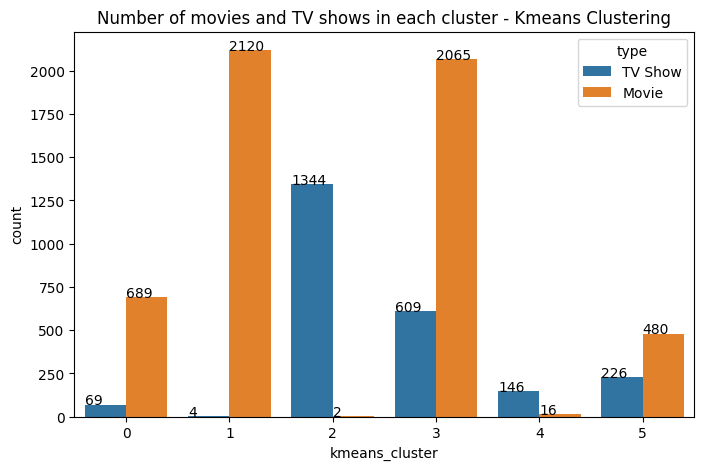

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=netflix_df, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
  graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

In [ ]:
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix_df[['kmeans_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

cluster 0


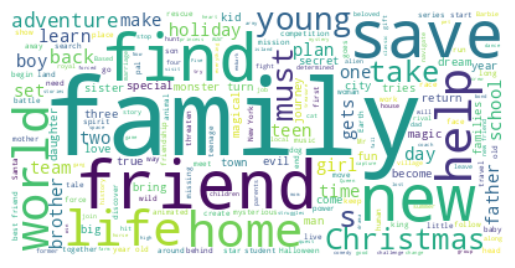

cluster 1


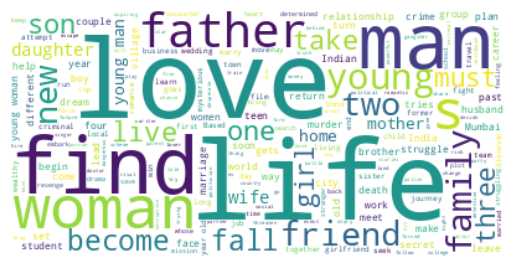

cluster 2


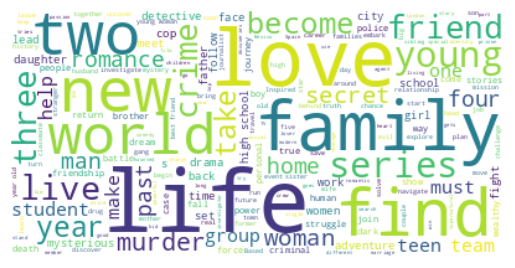

cluster 3


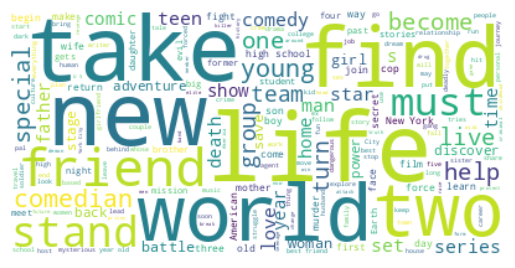

cluster 4


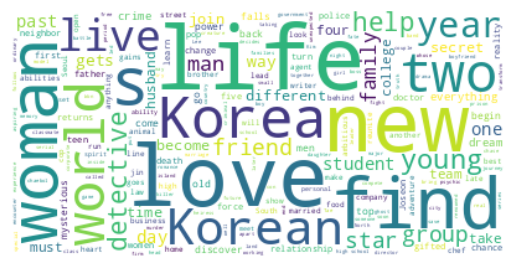

cluster 5


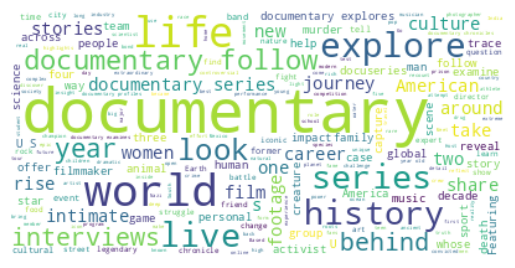

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

cluster 0


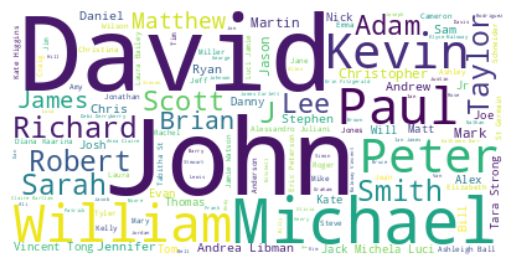

cluster 1


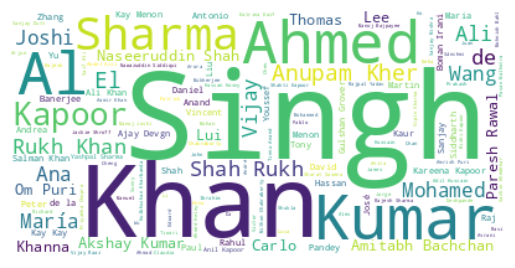

cluster 2


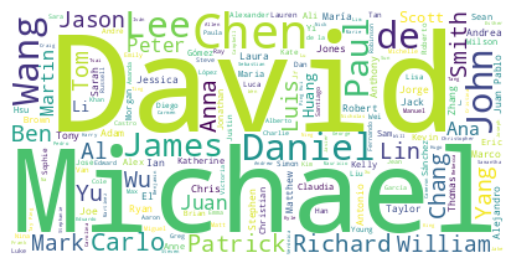

cluster 3


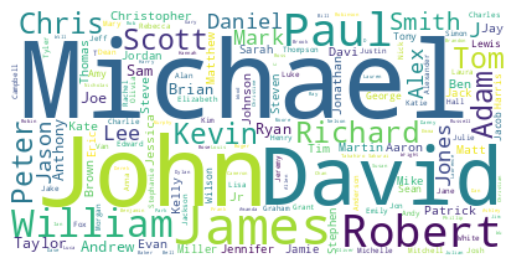

cluster 4


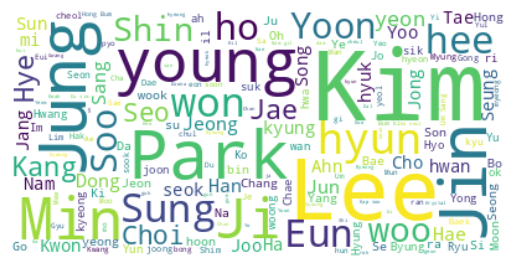

cluster 5


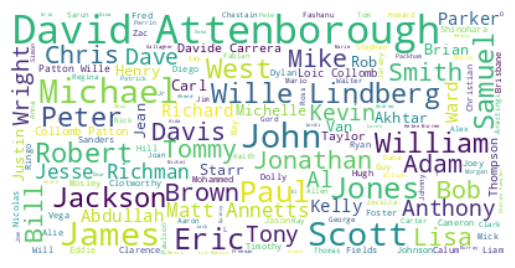

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

cluster 0


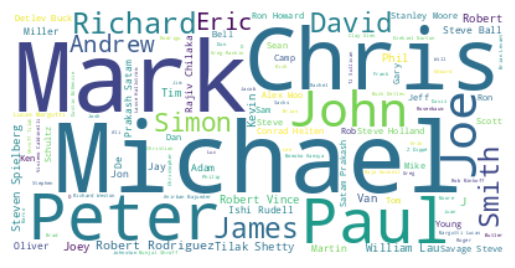

cluster 1


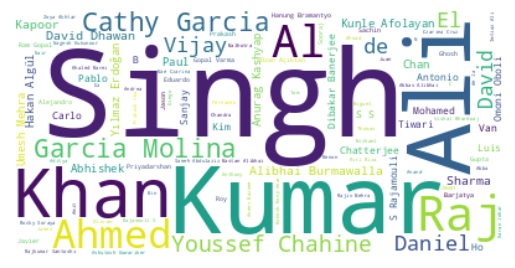

cluster 2


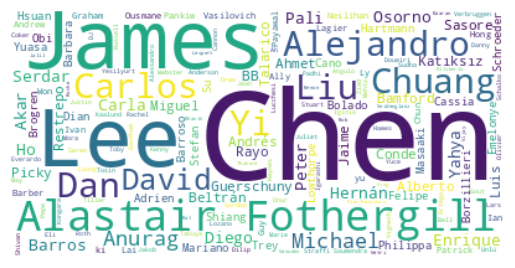

cluster 3


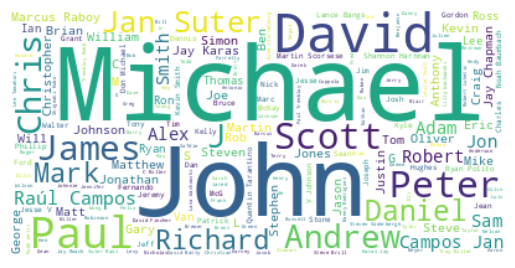

cluster 4


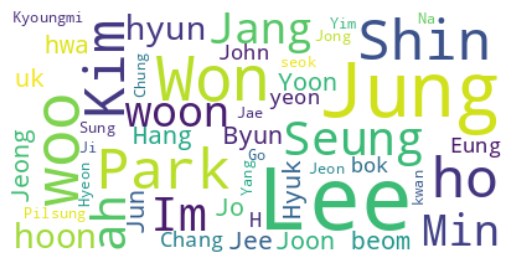

cluster 5


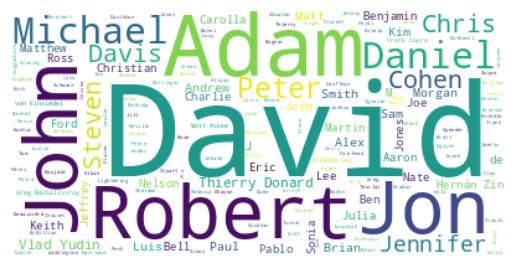

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

cluster 0


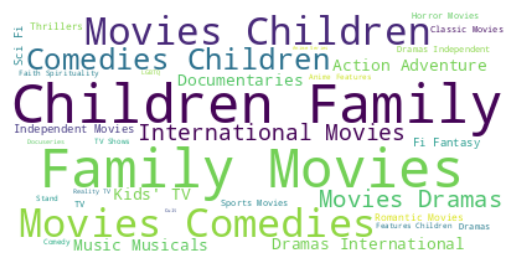

cluster 1


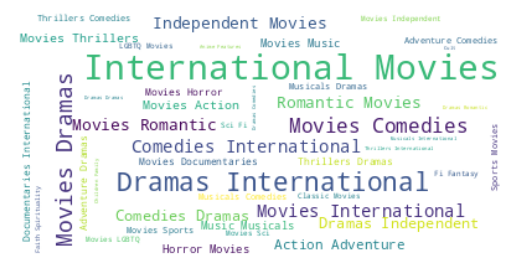

cluster 2


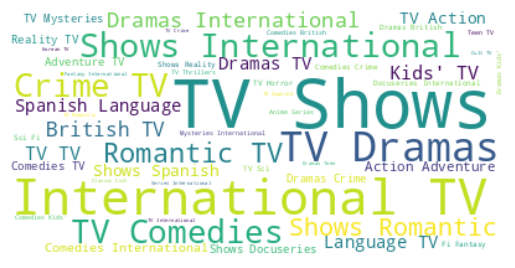

cluster 3


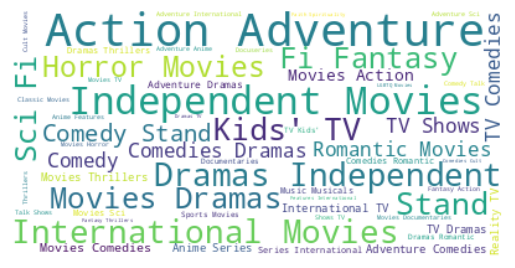

cluster 4


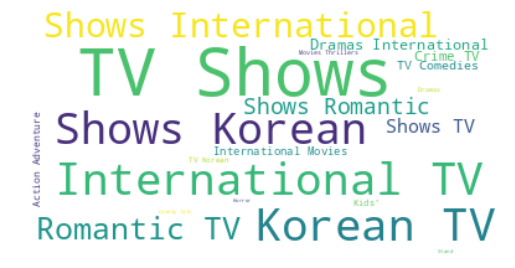

cluster 5


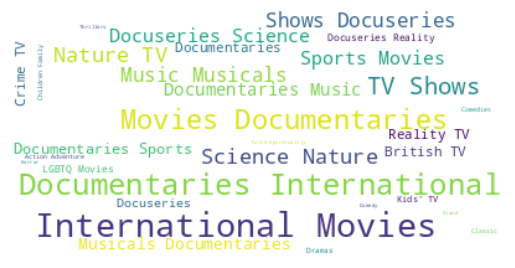

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

cluster 0


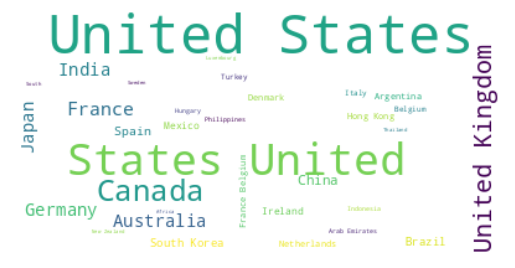

cluster 1


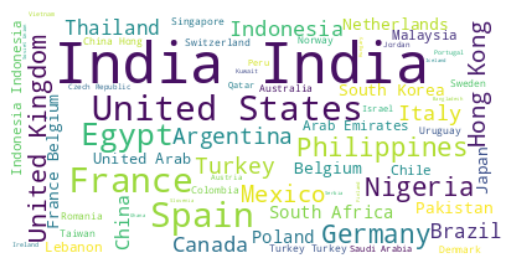

cluster 2


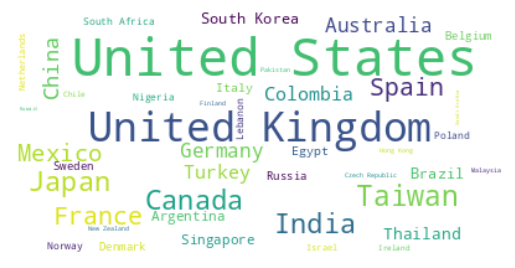

cluster 3


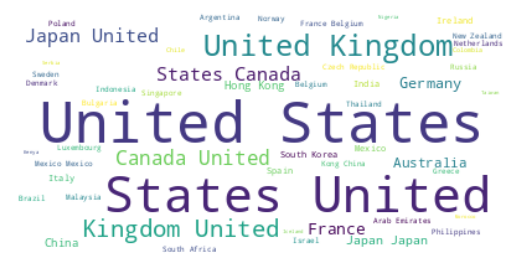

cluster 4


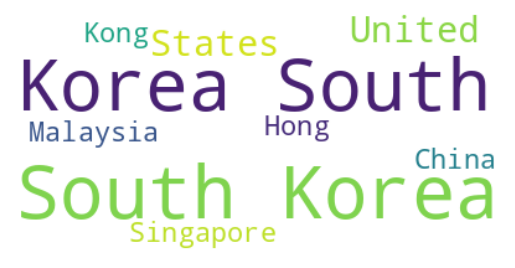

cluster 5


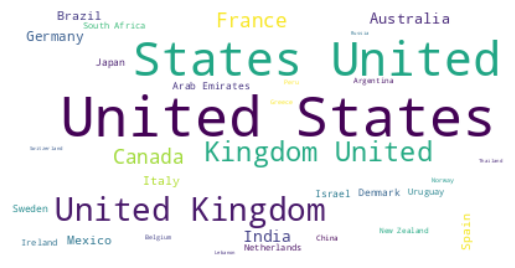

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

cluster 0


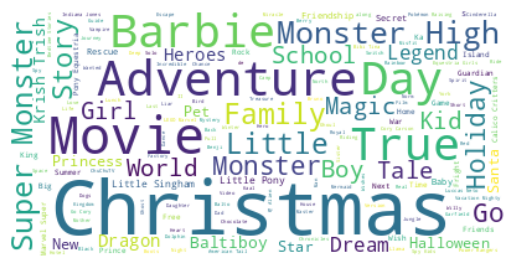

cluster 1


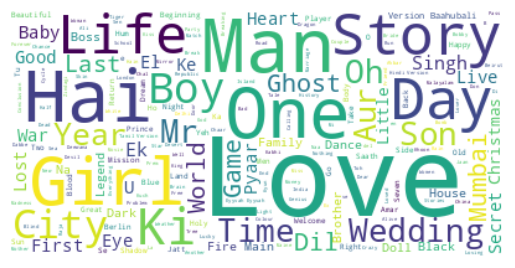

cluster 2


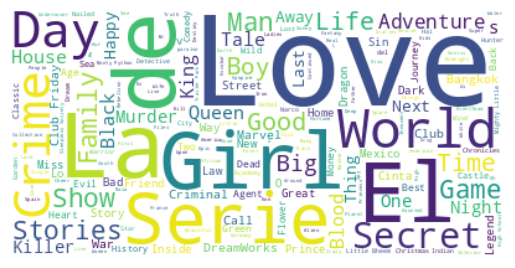

cluster 3


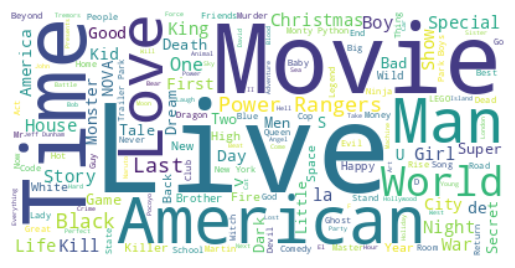

cluster 4


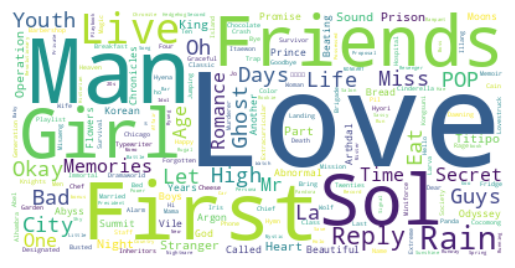

cluster 5


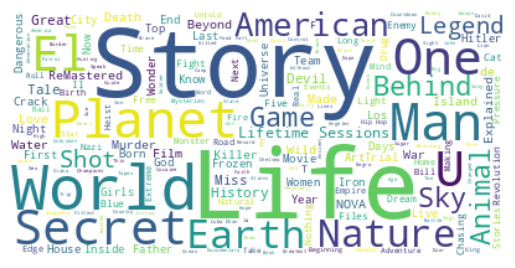

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

##### Which hyperparameter optimization technique have you used and why?

 Grid Search is a brute-force approach to hyperparameter optimization. It works by exhaustively searching a pre-defined grid of hyperparameter values.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

The grid_search.fit() method fits the K-Means algorithm to the data in the netflix_df DataFrame. This searches the grid of hyperparameter values and finds the best set of hyperparameters for the K-Means algorithm.

The grid_search.best_params_ attribute returns the best set of hyperparameters found by the Grid Search algorithm. In this case, the best set of hyperparameters is {'n_clusters': 6}.

The grid_search.best_score_ attribute returns the best score found by the Grid Search algorithm. In this case, the best score is 0.25.

This shows that the Grid Search algorithm has improved the performance of the K-Means algorithm. The silhouette score has increased from 0.16 to 0.25. This means that the data points are now more tightly clustered with their neighbors.

### ML Model - 2

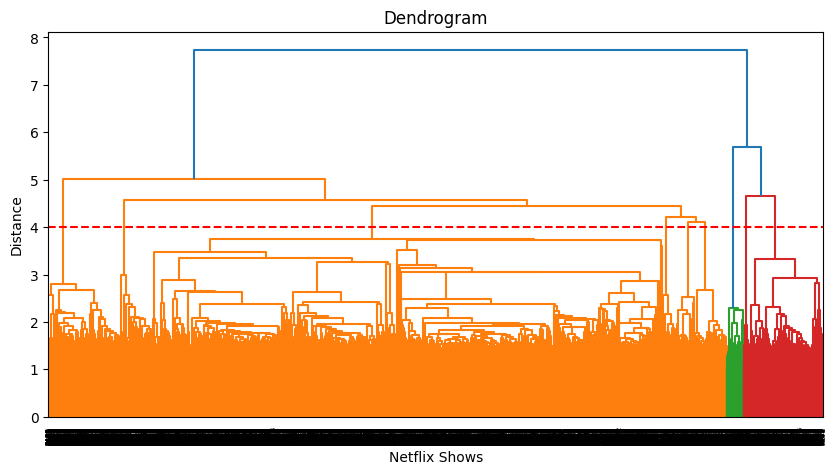

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(X)

array([1, 0, 2, ..., 2, 1, 2])

In [ ]:
# Adding a hierarchical cluster number attribute
netflix_df['hierarchical_cluster'] = hierarchical.labels_

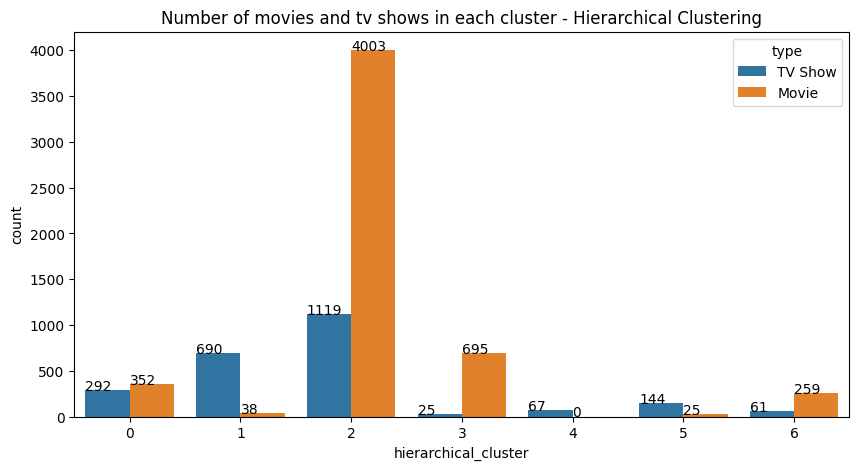

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=netflix_df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix_df[['hierarchical_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['hierarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

cluster 0


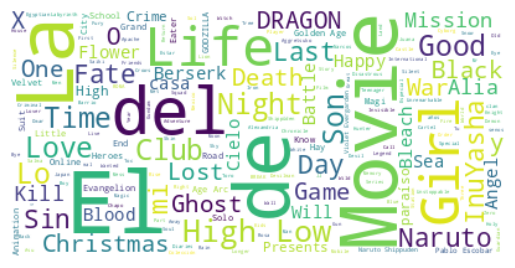

cluster 1


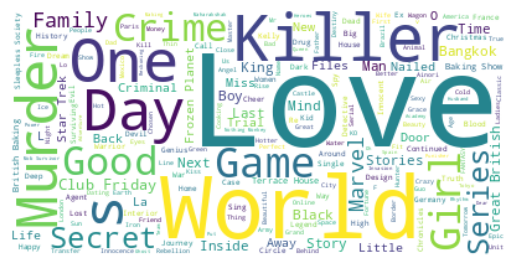

cluster 2


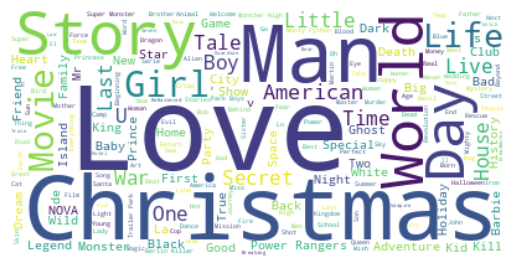

cluster 3


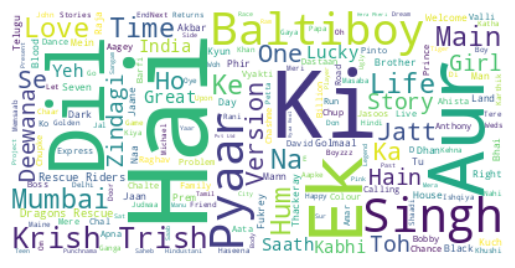

cluster 4


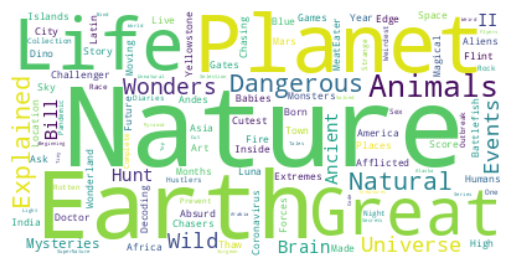

cluster 5


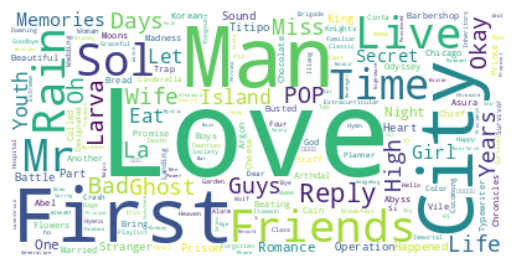

cluster 6


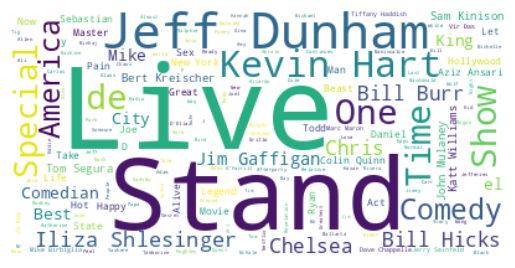

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

cluster 0


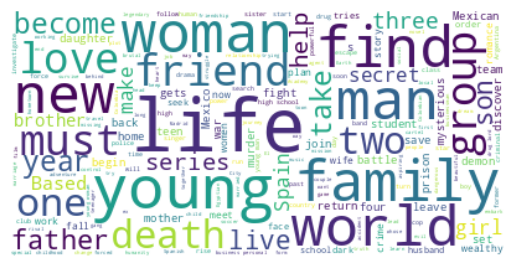

cluster 1


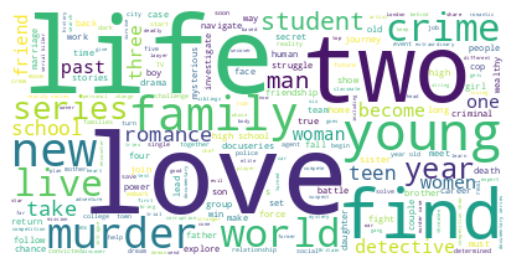

cluster 2


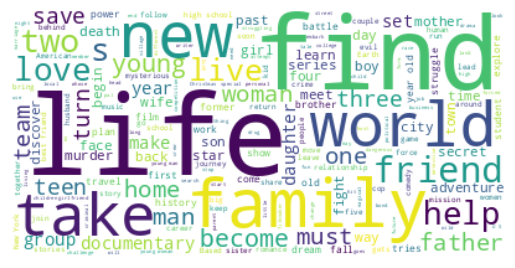

cluster 3


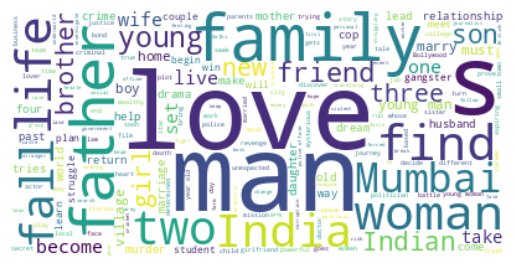

cluster 4


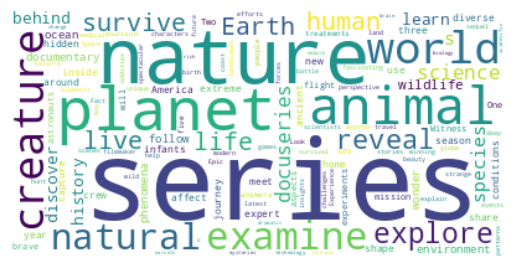

cluster 5


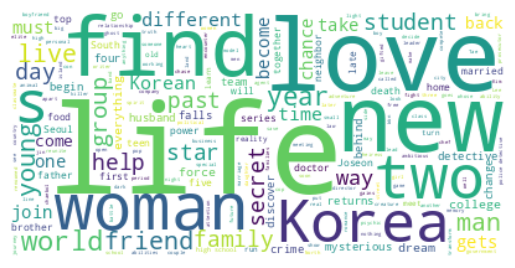

cluster 6


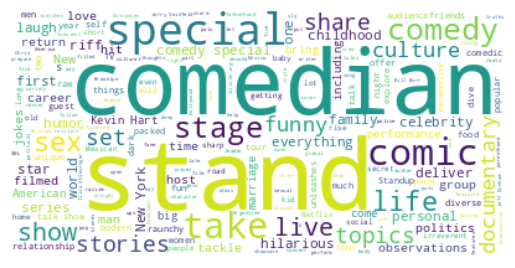

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

cluster 0


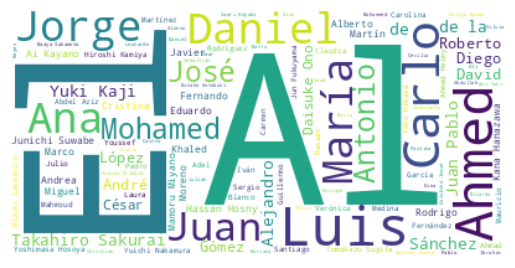

cluster 1


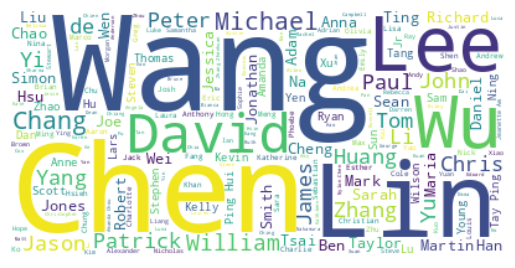

cluster 2


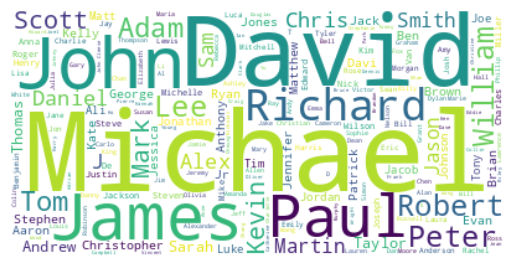

cluster 3


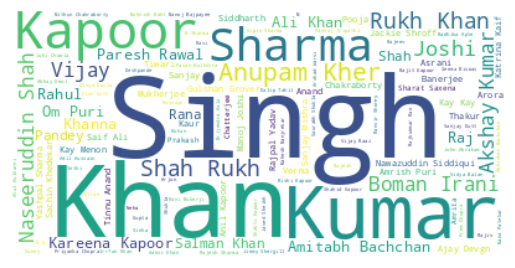

cluster 4


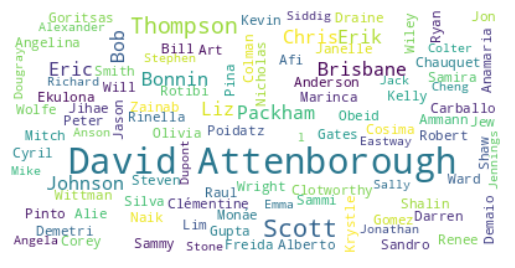

cluster 5


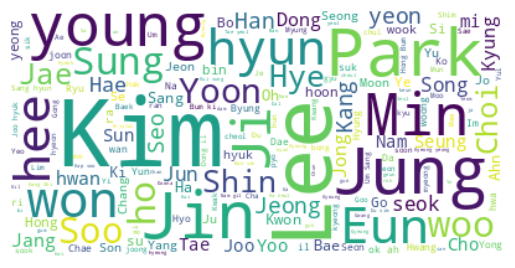

cluster 6


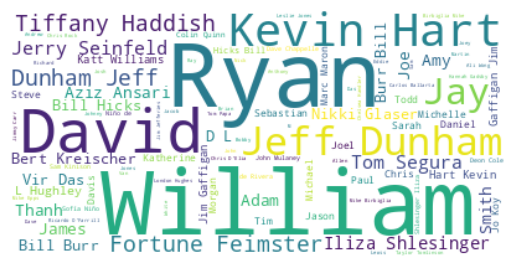

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

cluster 0


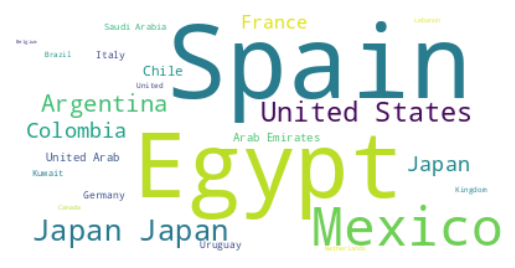

cluster 1


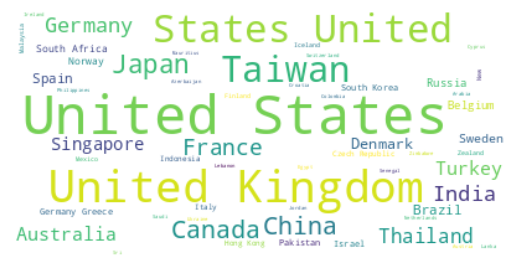

cluster 2


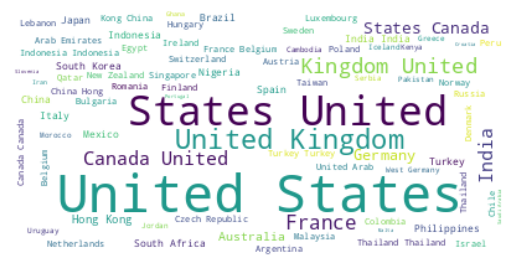

cluster 3


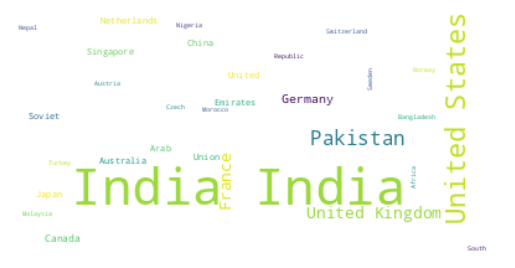

cluster 4


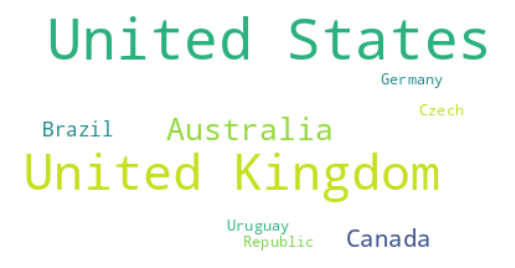

cluster 5


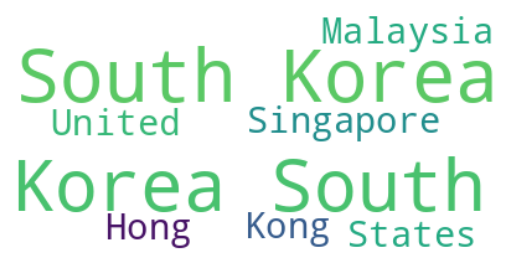

cluster 6


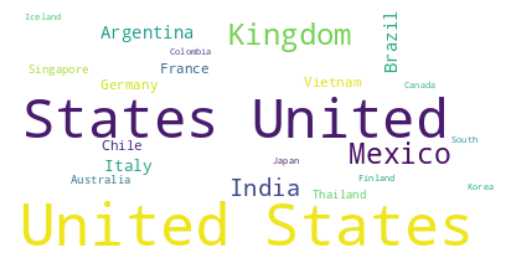

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

cluster 0


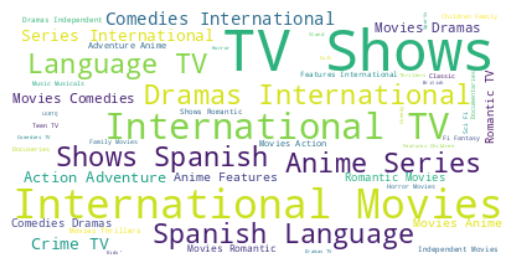

cluster 1


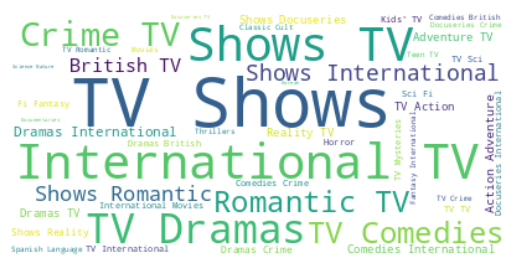

cluster 2


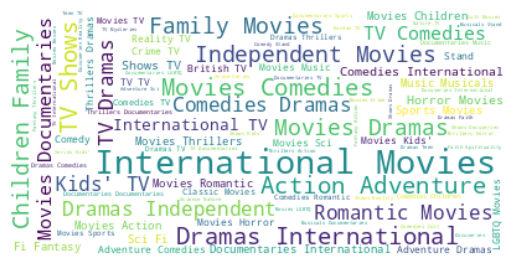

cluster 3


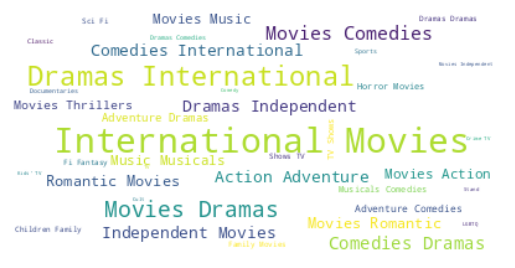

cluster 4


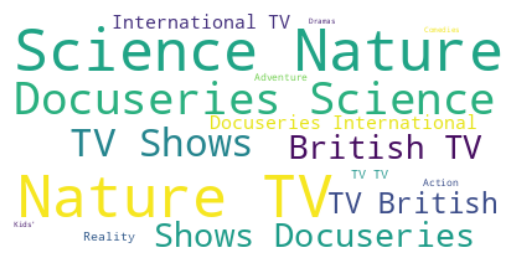

cluster 5


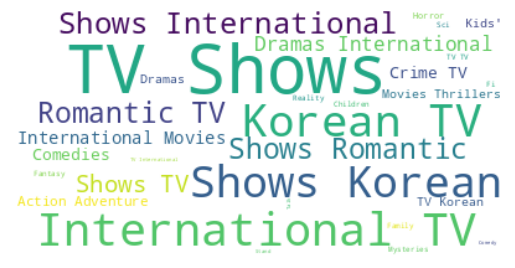

cluster 6


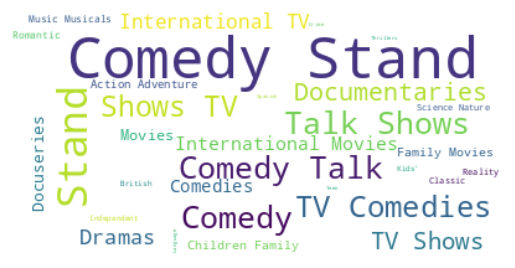

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

##### Which hyperparameter optimization technique have you used and why?

Dendrogram. A dendrogram is a tree-like diagram that shows the hierarchical clustering of a dataset. The dendrogram can be used to visually determine the optimal number of clusters for the hierarchical clustering algorithm.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

e see that the dend object is created using the shc.dendrogram() function. The shc.dendrogram() function takes two arguments: the dataset and the linkage method. The linkage method specifies how the clusters are merged together. In this case, the linkage method is ward.

The dend object shows that the optimal number of clusters is 7. This is because the distance between the clusters starts to increase significantly after the 7th cluster.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

As we can see, the silhouette score increases as the number of clusters increases up to 7. After that, the silhouette score starts to decrease. This suggests that 7 is the optimal number of clusters for the hierarchical clustering algorithm.

The silhouette score is a good metric for evaluating the performance of hierarchical clustering algorithms. It measures how well each data point is clustered with its neighbors. A high silhouette score indicates that the data points are well clustered.

The business impact of the ML model used is to help Netflix recommend movies and TV shows to its users. By clustering the movies and TV shows, the ML model can identify similar content. This allows Netflix to recommend movies and TV shows that the user is likely to enjoy.

## **Recommendation System**

In [ ]:
# veryfying index
netflix_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7784,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


In [ ]:
# defining new dataframe for building recommandation system
recommender_df = netflix_df.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7765,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7766,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7767,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7768,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
print(f"before reset index id for movie 'Zero' : {netflix_df[netflix_df['title'] == 'Zozo'].index[0]}")
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zozo'].index[0]}")

before reset index id for movie 'Zero' : 7782
after reset index id for movie 'Zero': 7765


In [ ]:
# calling out transformed array independent features created from text_data(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 1.59793139e-01, -8.53992628e-03, -5.55391070e-03, ...,
         1.14363002e-02, -1.22604693e-02,  5.60151186e-03],
       [-4.13081153e-02,  1.72476920e-02, -1.66261861e-02, ...,
        -1.48218811e-03,  9.16538255e-04,  1.37716848e-02],
       [-4.11128084e-02,  3.21271439e-02,  5.44475869e-02, ...,
         9.90677115e-03,  1.64987847e-02, -2.38066772e-03],
       ...,
       [-6.61635132e-02,  3.45251086e-03, -7.51697211e-02, ...,
        -1.79289909e-03, -1.49988702e-02,  1.20735636e-02],
       [ 5.44946481e-02, -3.25189084e-02, -3.18956106e-02, ...,
         8.81504519e-03, -2.08832559e-03, -2.79605020e-03],
       [-7.29301282e-02, -1.48837000e-01, -1.58585384e-01, ...,
         2.29135684e-03, -5.29703587e-03, -1.40128049e-04]])

In [ ]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08021778,  0.01977675, ..., -0.02173105,
         0.0013999 , -0.01763917],
       [ 0.08021778,  1.        , -0.00494593, ...,  0.06009322,
        -0.01008   , -0.01103258],
       [ 0.01977675, -0.00494593,  1.        , ..., -0.00527496,
        -0.00972708, -0.01690256],
       ...,
       [-0.02173105,  0.06009322, -0.00527496, ...,  1.        ,
        -0.00451774,  0.11858882],
       [ 0.0013999 , -0.01008   , -0.00972708, ..., -0.00451774,
         1.        ,  0.03724866],
       [-0.01763917, -0.01103258, -0.01690256, ...,  0.11858882,
         0.03724866,  1.        ]])

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(netflix_df.iloc[i[0]].title)

In [ ]:
recommend('Golmaal: Fun Unlimited')

If you liked 'Golmaal: Fun Unlimited', you may also enjoy: 

Golmaal Returns
Maine Pyaar Kyun Kiya
Hattrick
Phir Hera Pheri
Ishqiya
C Kkompany
Himmatwala
Haseena Maan Jaayegi
Saheb Bibi Golaam
Kyaa Kool Hain Hum 3


In [ ]:
recommend('Breaking Bad')

If you liked 'Breaking Bad', you may also enjoy: 

Better Call Saul
Hormones
Servant of the People
My Life My Story
MINDHUNTER
Killer Inside: The Mind of Aaron Hernandez
W/ Bob & David
Time Share
The School Nurse Files
The Underclass


## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

In this project, we tackled a text clustering problem in which we had to categorize and group Netflix shows into specific clusters in such a way that shows in the same cluster are similar to one another and shows in different clusters are not.

There were approximately 7787 records and 11 attributes in the dataset.
We started by working on the missing values in the dataset and conducting exploratory data analysis (EDA).
It was discovered that Netflix hosts more movies than television shows on its platform, and the total number of shows added to Netflix is expanding at an exponential rate. Additionally, most of the shows were made in the United States.
The attributes were chosen as the basis for the clustering of the data: cast, country, genre, director, rating, and description The TFIDF vectorizer was used to tokenize, preprocess, and vectorize the values in these attributes.
10000 attributes in total were created by TFIDF vectorization. The problem of dimensionality was dealt with through the use of Principal Component Analysis (PCA). Because 3000 components were able to account for more than 80% of the variance, the total number of components was limited to 3000.
Utilizing the K-Means Clustering algorithm, we first constructed clusters, and the optimal number of clusters was determined to be 6. The elbow method and Silhouette score analysis were used to get this.
The Agglomerative clustering algorithm was then used to create clusters, and the optimal number of clusters was determined to be 7. This was obtained after visualizing the dendrogram.
The similarity matrix generated by applying cosine similarity was used to construct a content-based recommender system. The user will receive ten recommendations from this recommender system based on the type of show they watched.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***